In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt


In [2]:
import matplotlib as plt
import geopandas 
data = pd.read_csv('death_cause_brazil.csv')

In [3]:
data.head()

,date,state,gender,age,color,cause,total
0,2020-01-01,AC,F,60 - 69,East asian,Septicemia,1
1,2019-01-01,AC,F,80 - 89,White,Hearth attack,1
2,2019-01-01,AC,F,30 - 39,Indigenous,Others,1
3,2019-01-01,AC,F,70 - 79,Mixed,Cardiogenic shock,1
4,2020-01-01,AC,F,70 - 79,Mixed,Pneumonia,1


In [4]:
sumdata = data['total'].sum()
print(sumdata)

2056363


In [5]:
data = data.dropna()

In [6]:
sumdata = data['total'].sum()
print(sumdata)

2056363


In [7]:

# Deaths 2019 brazil = 1349802
# Didn't have any case in 2019 of corona in brazil 
date2019 = pd.DataFrame({'date': pd.date_range(start='01-01-2019', end='12-31-2019')})
date2019['date'].groupby(date2019.date.dt.to_period("M")).agg('count')



date
2019-01    31
2019-02    28
2019-03    31
2019-04    30
2019-05    31
2019-06    30
2019-07    31
2019-08    31
2019-09    30
2019-10    31
2019-11    30
2019-12    31
Freq: M, Name: date, dtype: int64

In [8]:

#data0 = data[['date', 'cause','total']].groupby(['cause','date']).mean()
#data0


In [9]:
# Brazil didn't have no cause of corona in 2019.drop 2019
data = data[~data.date.str.contains("2019")]


In [10]:
date_total = data[['date','total']].groupby(['date']).mean()
date_total


,total
date,
2020-01-01,1.921719
2020-01-02,1.910909
2020-01-03,1.841687
2020-01-04,1.790528
2020-01-05,1.841709
...,...
2020-09-11,1.454783
2020-09-12,1.400939
2020-09-13,1.358079


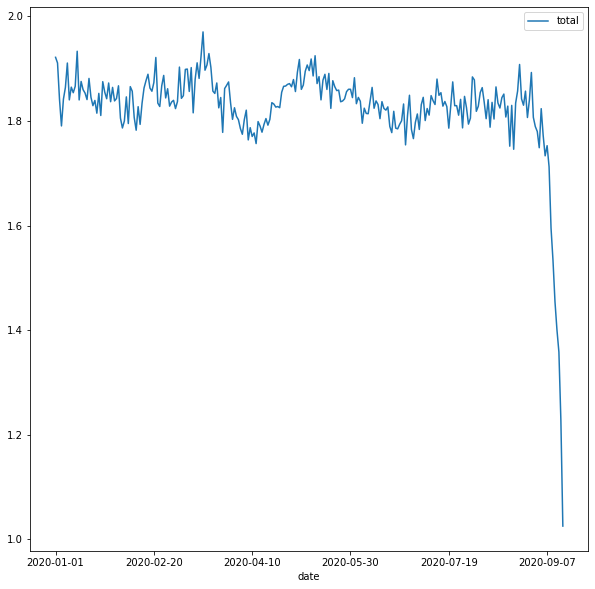

In [11]:


date_total.plot( figsize=(10,10));


In [12]:
date_gender = data[['date','gender']].groupby(['gender']).count()
date_gender

,date
gender,
F,230793
M,266019


<AxesSubplot:xlabel='gender'>

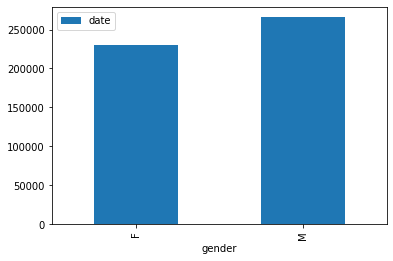

In [13]:
date_gender.plot(kind='bar')

In [14]:
data0 = data[['date', 'cause','total']].groupby(['cause','date']).count()
data0

total
cause             date             
Cardiogenic shock 2020-01-01     75
                  2020-01-02     70
                  2020-01-03     77
                  2020-01-04     84
                  2020-01-05     63
...                             ...
Undetermined      2020-09-11     12
                  2020-09-12      7
                  2020-09-13      7
                  2020-09-14      4
                  2020-09-15      1

[3397 rows x 1 columns]

In [15]:
#data = data.drop(columns='date', axis=1)

In [16]:
sumdata = data['total'].sum()
print(sumdata)

911136


In [17]:
data.head()

,date,state,gender,age,color,cause,total
0,2020-01-01,AC,F,60 - 69,East asian,Septicemia,1
4,2020-01-01,AC,F,70 - 79,Mixed,Pneumonia,1
5,2020-01-01,AC,F,< 9,Mixed,Pneumonia,1
6,2020-01-01,AC,F,< 9,Mixed,Septicemia,1
7,2020-01-01,AC,F,40 - 49,Mixed,Stroke,1


In [18]:
data1 = data[['gender', 'color', 'cause', 'total']].groupby(['color','gender', 'cause']).agg({'total': ['sum']})

data1.sort_values(by=('total', 'sum'))
#race, gender and cause(Corona) 2019 to 2020


total
                                           sum
color      gender cause                       
Indigenous M      Covid (hearth attack)      2
           F      Covid (hearth attack)      2
           M      Undetermined               4
           F      Undetermined               5
                  Sudden death               7
...                                        ...
Ignored    M      Others                 34200
Mixed      F      Others                 36599
           M      Others                 56018
White      F      Others                 65366
           M      Others                 73934

[168 rows x 1 columns]

In [19]:
data2 = data[['gender', 'color', 'cause', 'total']].groupby(['cause','gender', 'color']).mean()

data2.sort_values('total', ascending=False)
# by Cause gender color . Corona Deaths in Brazil 

total
cause                 gender color               
Others                M      White       3.340593
                      F      White       3.176808
                      M      Ignored     3.066990
Covid                 M      White       2.823645
Others                F      Ignored     2.781824
...                                           ...
Stroke                M      Indigenous  1.000000
Cardiopathy           M      Indigenous  1.000000
Covid (hearth attack) F      Indigenous  1.000000
                             East asian  1.000000
Pneumonia             M      Indigenous  1.000000

[168 rows x 1 columns]

In [20]:
data3 = data[['cause', 'total']].groupby('cause').count()
data3.sort_values('total', ascending= False)


,total
cause,
Others,129293
Pneumonia,56374
Septicemia,55990
Stroke,44309
Covid,42255
Hearth attack,39390
Respiratory failure,38290
Covid (stroke),24087
Cardiopathy,22535


<AxesSubplot:xlabel='cause'>

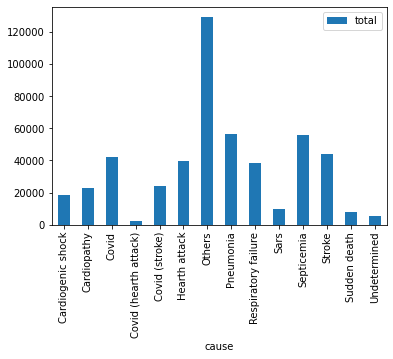

In [21]:
data3.plot(kind='bar')

In [22]:
color_cause = data[['color', 'cause', 'total']].groupby(['color', 'cause']).count()
color_cause



total
color cause                       
Black Cardiogenic shock       1529
      Cardiopathy             2102
      Covid                   4643
      Covid (hearth attack)    164
      Covid (stroke)          2415
...                            ...
White Sars                    3753
      Septicemia             22087
      Stroke                 17078
      Sudden death            3461
      Undetermined            2044

[84 rows x 1 columns]

<AxesSubplot:xlabel='color,cause'>

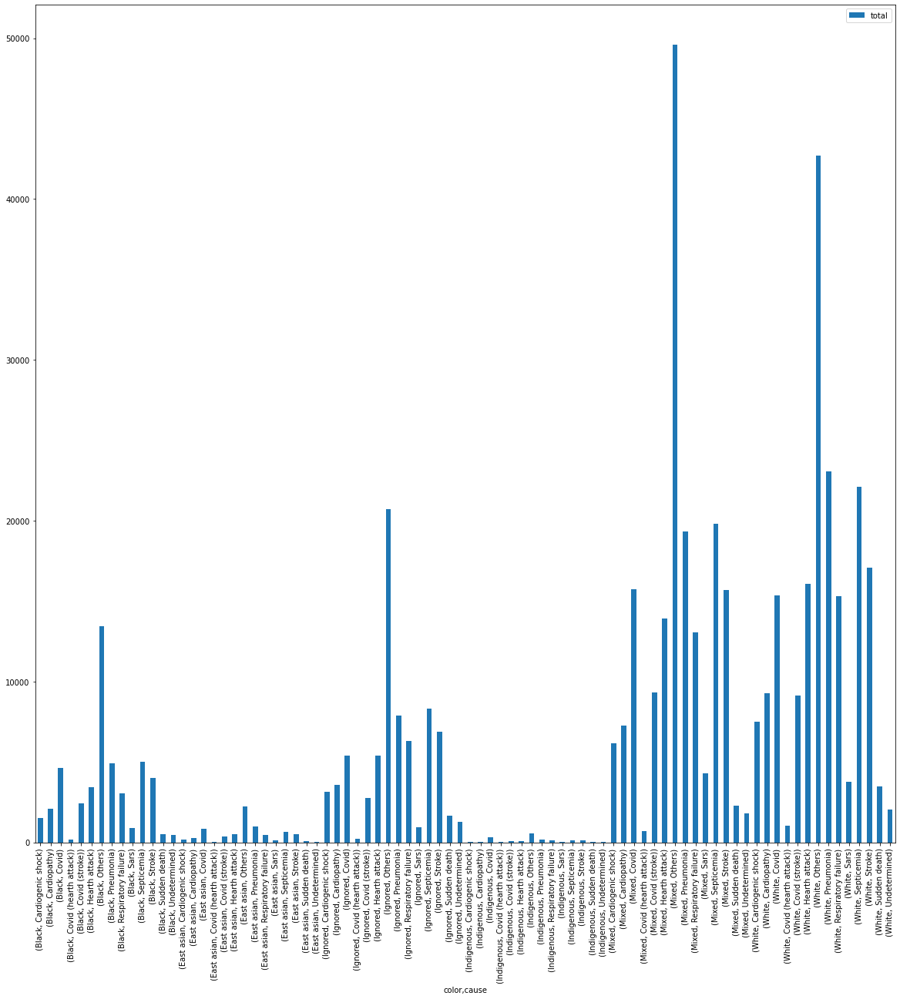

In [23]:
color_cause.plot(kind='bar', figsize=(20, 20))

In [24]:
data4 = data[['age', 'cause', 'total']].groupby(['age', 'cause']).count()
data4


total
age     cause                   
10 - 19 Cardiogenic shock    113
        Cardiopathy           33
        Covid                224
        Covid (stroke)        60
        Hearth attack         70
...                          ...
N/I     Sars                  36
        Septicemia           184
        Stroke               297
        Sudden death          36
        Undetermined         136

[167 rows x 1 columns]

In [25]:
age = data[['age','total']].groupby('age').count()
age
#death in Brazil(corona virus) by age

,total
age,
10 - 19,5303
20 - 29,12894
30 - 39,22154
40 - 49,38037
50 - 59,61091
60 - 69,84774
70 - 79,95873
80 - 89,91149
90 - 99,51063


<AxesSubplot:xlabel='age'>

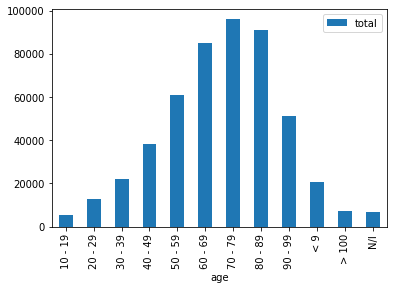

In [26]:

age.plot(kind='bar')


<AxesSubplot:xlabel='age,gender'>

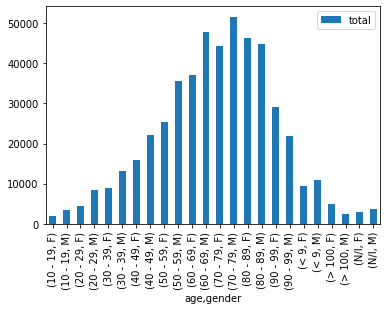

In [27]:
gender = data[['age','gender', 'total']].groupby(['age','gender']).count()
gender.plot(kind='bar')
#Deaths in Brazil in 2019 and 2020 by age and gender

<AxesSubplot:xlabel='color'>

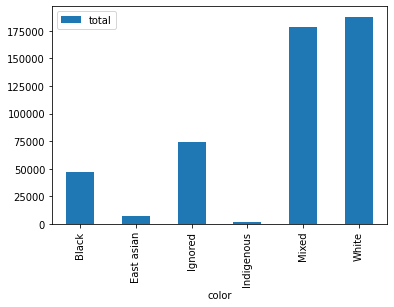

In [28]:
color = data[['color','total']].groupby(['color']).count()
color.plot(kind='bar')

In [29]:
state = data[['state','total']].groupby('state').count()
state

,total
state,
AC,2952
AL,10925
AM,9955
AP,1778
BA,27577
CE,22522
DF,10896
ES,15970
GO,19887


<AxesSubplot:ylabel='total'>

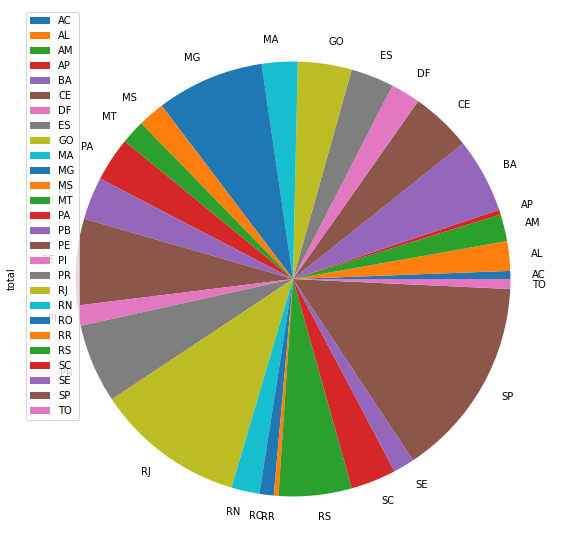

In [30]:
state.plot(kind='pie', y='total', figsize=(20, 10))

<AxesSubplot:ylabel='total'>

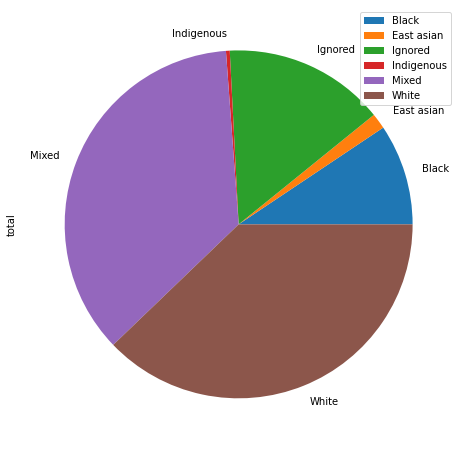

In [31]:
color_total = data[['color', 'total']].groupby(['color']).count()
color_total.plot(kind='pie', y = 'total', figsize=(10,8))




<AxesSubplot:xlabel='gender'>

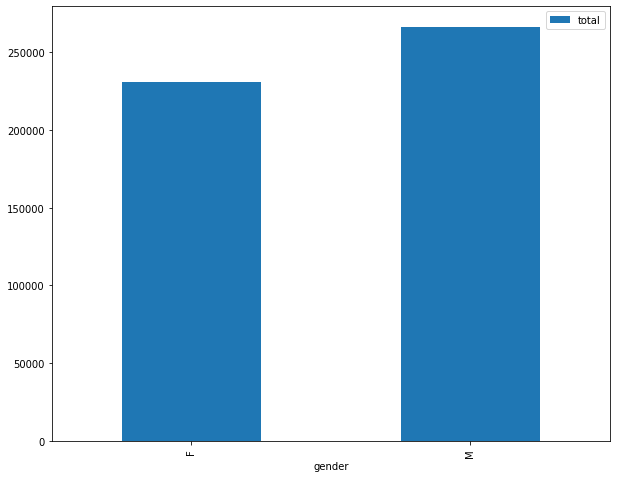

In [32]:
color_total = data[['gender', 'total']].groupby(['gender']).count()
color_total.plot(kind='bar', figsize=(10,8))

<AxesSubplot:xlabel='gender,age'>

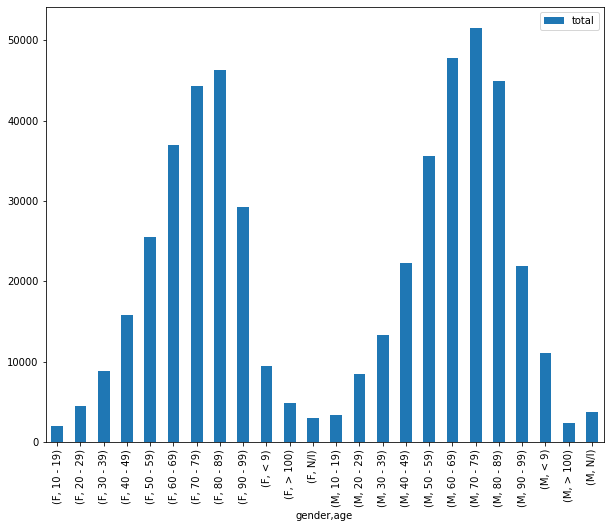

In [33]:
ageGender = data[['gender','age' ,'total']].groupby(['gender','age']).count()
ageGender.plot(kind='bar', figsize=(10,8))

<AxesSubplot:xlabel='gender,age'>

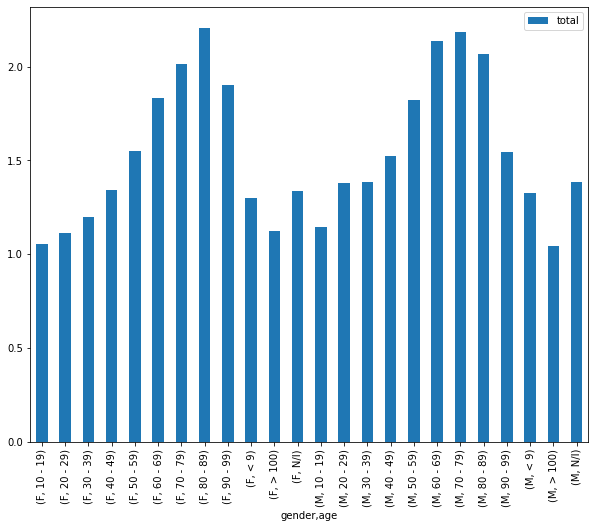

In [34]:
ageGender = data[['gender','age' ,'total']].groupby(['gender','age']).mean()
ageGender.plot(kind='bar', figsize=(10,8))

In [35]:
# drop cause: unknown, others, Undetermined, Sudden death because they are not clear causes
newdata = data[~data['cause'].isin(['Unknwon'])]
newdata = newdata[~newdata['cause'].isin(['Others'])]
newdata = newdata[~newdata['cause'].isin(['Undetermined'])]
newdata = newdata[~newdata['cause'].isin(['Sudden death'])]



In [36]:
sumdata2 = newdata['total'].sum()
print(sumdata2)

581149


In [37]:
dataCause = newdata[['cause', 'total']].groupby('cause').count()
dataCause.sort_values('total', ascending= False)



,total
cause,
Pneumonia,56374
Septicemia,55990
Stroke,44309
Covid,42255
Hearth attack,39390
Respiratory failure,38290
Covid (stroke),24087
Cardiopathy,22535
Cardiogenic shock,18535


<AxesSubplot:xlabel='cause'>

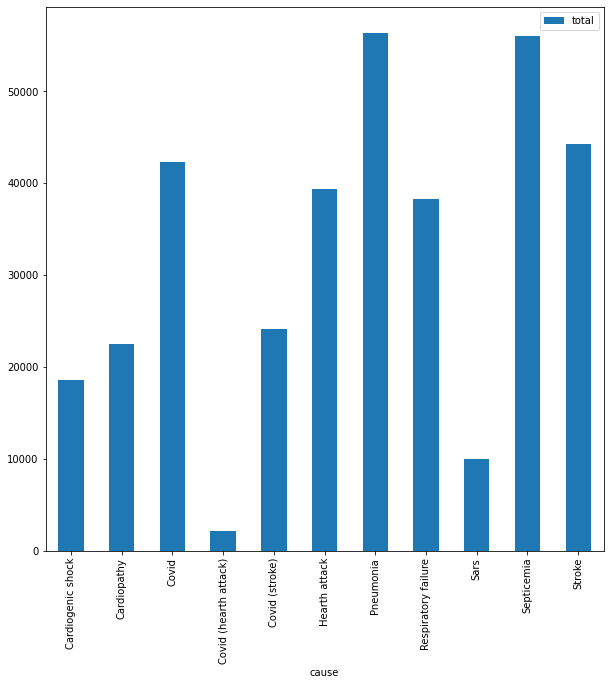

In [38]:
dataCause.plot(kind='bar', figsize=(10,10))

<AxesSubplot:xlabel='gender'>

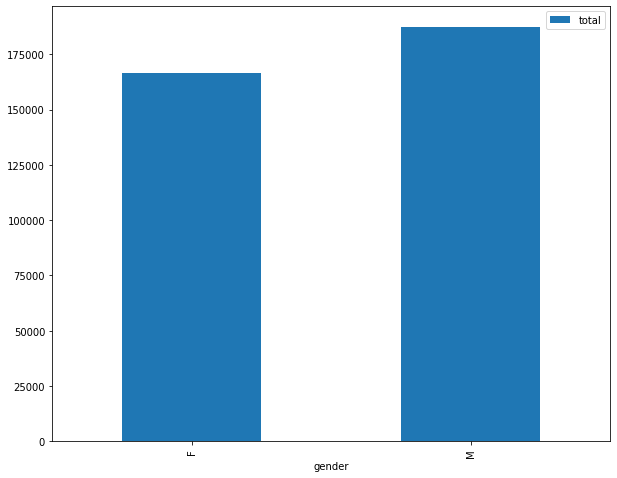

In [39]:
color_gender = newdata[['gender', 'total']].groupby(['gender']).count()
color_gender.plot(kind='bar', figsize=(10,8))

<AxesSubplot:ylabel='total'>

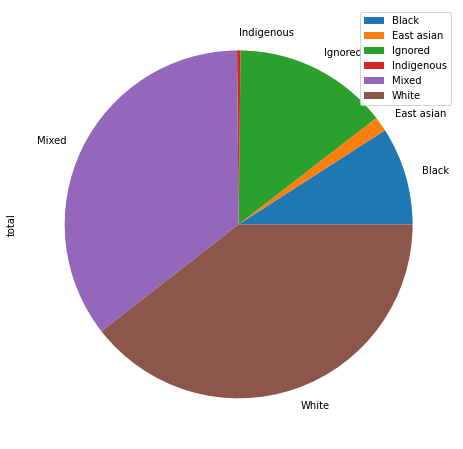

In [40]:
color_total2 = newdata[['color', 'total']].groupby(['color']).count()
color_total2.plot(kind='pie', y = 'total', figsize=(10,8))

<AxesSubplot:xlabel='age'>

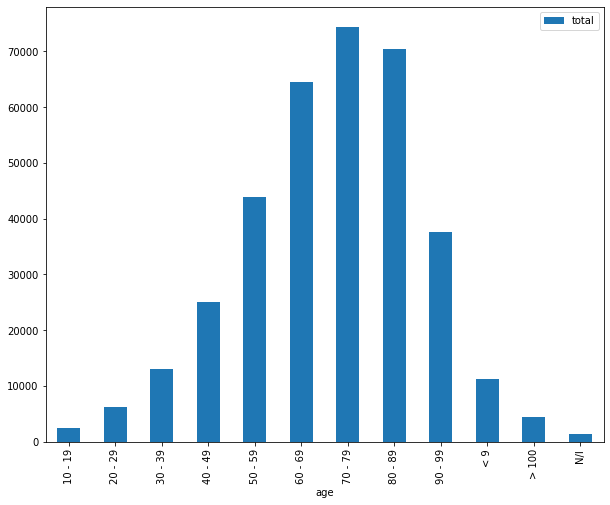

In [41]:
color_age_total2 = newdata[['age', 'total']].groupby(['age']).count()
color_age_total2.plot(kind='bar', figsize=(10,8))

<AxesSubplot:xlabel='age,gender'>

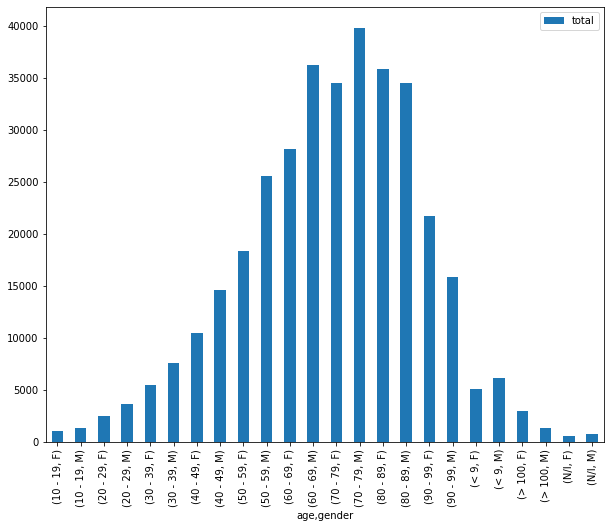

In [42]:
color_age_gender2 = newdata[['age', 'gender', 'total']].groupby(['age','gender']).count()
color_age_gender2.plot(kind='bar', figsize=(10,8))

In [43]:
state2 = newdata[['state','total']].groupby('state').count()
state2

,total
state,
AC,1766
AL,7390
AM,6673
AP,1325
BA,19438
CE,15409
DF,7586
ES,11345
GO,14596


<AxesSubplot:xlabel='state'>

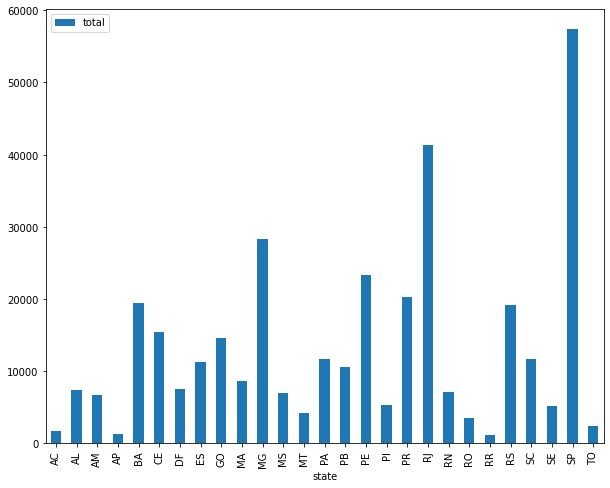

In [44]:
state2.plot(kind='bar', figsize=(10,8))

In [45]:
#rate of deaths = https://www.cdc.gov/csels/dsepd/ss1978/lesson3/section3.html
# Brazil population 2020 = 211.755.692 https://agenciadenoticias.ibge.gov.br/agencia-sala-de-imprensa/2013-agencia-de-noticias/releases/28668-ibge-divulga-estimativa-da-populacao-dos-municipios-para-2020
#1.314.097... - Veja mais em https://noticias.uol.com.br/saude/ultimas-noticias/redacao/2020/12/13/com-13-mi-registros-ate-novembro2020-ja-bate-recorde-de-mortes-no-brasil.htm?cmpid=copiaecola
deaths_total_2020 = 1314097
sumdeathCorona2 = newdata['total'].sum()
population =211755692

#rate population 
rate = (sumdeathCorona2*100000)/(population*100000)
print(rate)
crude_rate = (deaths_total_2020*100000)/(population*100000)
print(crude_rate)




0.002744431540475427
0.006205722205568859


In [46]:
age_rate = newdata[['age','total']].groupby('age').count()

age_rate


,total
age,
10 - 19,2351
20 - 29,6146
30 - 39,12998
40 - 49,25070
50 - 59,43879
60 - 69,64451
70 - 79,74280
80 - 89,70403
90 - 99,37517


In [47]:
save = newdata['age'].value_counts()
save


70 - 79    74280
80 - 89    70403
60 - 69    64451
50 - 59    43879
90 - 99    37517
40 - 49    25070
30 - 39    12998
< 9        11172
20 - 29     6146
> 100       4360
10 - 19     2351
N/I         1287
Name: age, dtype: int64

In [48]:

date_total2 = newdata[['date','total']].groupby(['date']).mean()
date_total2



,total
date,
2020-01-01,1.702726
2020-01-02,1.678967
2020-01-03,1.634369
2020-01-04,1.603433
2020-01-05,1.647834
...,...
2020-09-11,1.359155
2020-09-12,1.277487
2020-09-13,1.289231


<AxesSubplot:xlabel='date'>

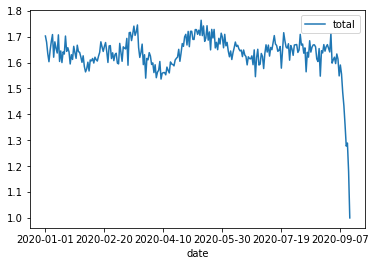

In [49]:
date_total2.plot()

In [50]:
import geopandas as gpd

fp = "LM_UF.shp"
map_df = gpd.read_file(fp, encoding='utf-8')
map_df.head()

,PK,nome,codigoUf,siglaUf,PRIMARYIND,geometry
0,1,b'Para\xedba',25,PB,1,"MULTIPOLYGON (((-34.92545 -6.68227, -34.92778 ..."
1,2,b'Paran\xe1',41,PR,2,"MULTIPOLYGON (((-48.39160 -25.32784, -48.39677..."
2,3,Sergipe,28,SE,3,"MULTIPOLYGON (((-37.02340 -10.93902, -37.02570..."
3,4,Rio de Janeiro,33,RJ,4,"MULTIPOLYGON (((-40.97131 -22.05305, -40.97191..."
4,5,Rio Grande do Sul,43,RS,5,"MULTIPOLYGON (((-51.28678 -30.06487, -51.28926..."


<AxesSubplot:>

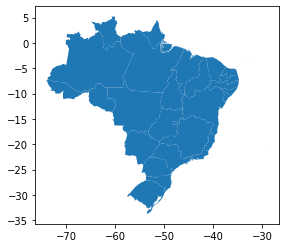

In [51]:
map_df.plot()

In [52]:
import numpy as np
import pandas as pd
import shapefile as shp
import matplotlib.pyplot as plt
import seaborn as sns



<AxesSubplot:>

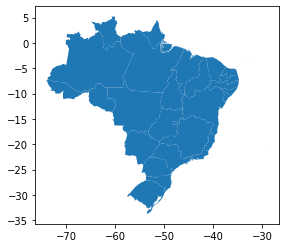

In [53]:
map_df.plot()

In [54]:
map_df.head(10)

,PK,nome,codigoUf,siglaUf,PRIMARYIND,geometry
0,1,b'Para\xedba',25,PB,1,"MULTIPOLYGON (((-34.92545 -6.68227, -34.92778 ..."
1,2,b'Paran\xe1',41,PR,2,"MULTIPOLYGON (((-48.39160 -25.32784, -48.39677..."
2,3,Sergipe,28,SE,3,"MULTIPOLYGON (((-37.02340 -10.93902, -37.02570..."
3,4,Rio de Janeiro,33,RJ,4,"MULTIPOLYGON (((-40.97131 -22.05305, -40.97191..."
4,5,Rio Grande do Sul,43,RS,5,"MULTIPOLYGON (((-51.28678 -30.06487, -51.28926..."
5,6,Santa Catarina,42,SC,6,"MULTIPOLYGON (((-48.59134 -25.97978, -48.59299..."
6,7,b'S\xe3o Paulo',35,SP,7,"MULTIPOLYGON (((-44.90589 -23.35318, -44.90678..."
7,8,b'Amap\xe1',16,AP,8,"MULTIPOLYGON (((-50.50034 2.09786, -50.50185 2..."
8,9,b'Cear\xe1',23,CE,9,"MULTIPOLYGON (((-40.20093 -2.81293, -40.20502 ..."
9,10,Distrito Federal,53,DF,10,"MULTIPOLYGON (((-29.34586 0.91777, -29.34587 0..."


In [55]:
newdata.head()

,date,state,gender,age,color,cause,total
0,2020-01-01,AC,F,60 - 69,East asian,Septicemia,1
4,2020-01-01,AC,F,70 - 79,Mixed,Pneumonia,1
5,2020-01-01,AC,F,< 9,Mixed,Pneumonia,1
6,2020-01-01,AC,F,< 9,Mixed,Septicemia,1
7,2020-01-01,AC,F,40 - 49,Mixed,Stroke,1


In [56]:
state2 = newdata[['state','total']].groupby(('state'),as_index=False).count()
state2

,state,total
0,AC,1766
1,AL,7390
2,AM,6673
3,AP,1325
4,BA,19438
5,CE,15409
6,DF,7586
7,ES,11345
8,GO,14596
9,MA,8687


In [57]:
#join the data 
merged = map_df.set_index('siglaUf').join(state2.set_index("state"))
merged.head()

,PK,nome,codigoUf,PRIMARYIND,geometry,total
siglaUf,,,,,,
PB,1,b'Para\xedba',25,1,"MULTIPOLYGON (((-34.92545 -6.68227, -34.92778 ...",10625
PR,2,b'Paran\xe1',41,2,"MULTIPOLYGON (((-48.39160 -25.32784, -48.39677...",20239
SE,3,Sergipe,28,3,"MULTIPOLYGON (((-37.02340 -10.93902, -37.02570...",5205
RJ,4,Rio de Janeiro,33,4,"MULTIPOLYGON (((-40.97131 -22.05305, -40.97191...",41326
RS,5,Rio Grande do Sul,43,5,"MULTIPOLYGON (((-51.28678 -30.06487, -51.28926...",19127


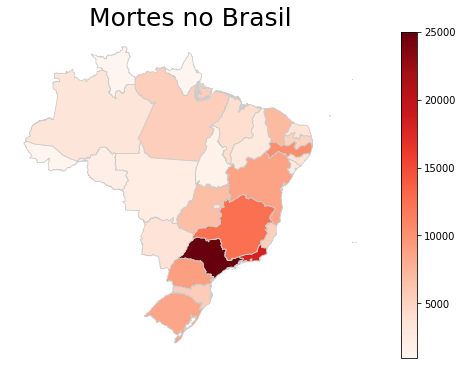

In [58]:
#create map
death_brazil = 'total'
vmin, vmax = 1000,25000
fig, ax = plt.subplots(1, figsize=(10,6))
merged.plot(column=death_brazil, cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8')
ax.axis('off')
ax.set_title('Mortes no Brasil', fontdict={'fontsize': '25', 'fontweight' : '3'})

#color legend
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))
# empty array for the data range
sm._A = []
# add the colorbar to the figure
cbar = fig.colorbar(sm)

In [59]:
ax.axis('off')


(-76.25697265565714, -26.582568221505483, -35.7018588272153, 7.22888375003369)

In [60]:
fig.savefig('map_export.png', dpi=300)